## Exploratory data analysis of US Protest Data

In [6]:
#!pip install geopandas
!pip install -U kaleido

Import libraries

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import geopandas as gpd
import datetime as dt
import kaleido
import plotly.io as pio
import matplotlib.pylab as pl
import seaborn as sns

In [8]:
df = pd.read_csv('North_America-United_States.csv')

### Using ACLED user guide found here: 
https://www.acleddata.com/wp-content/uploads/2016/01/ACLED_User-Guide_2016.pdf

In [9]:
df.head()

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9383068,840,USA44621,44621,24 June 2022,2022,1,Protests,Excessive force against protesters,Protesters (United States),...,Cedar Rapids,41.9738,-91.6768,1,KCRG-TV9; Network Contagion Research Institute...,Local partner-National,"On 24 June 2022, 'pro-choice' protesters gathe...",0,1656458658,USA
1,9383099,840,USA44775,44775,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,Fayetteville,36.0626,-94.1574,1,Southwest Times Record; 40/29,Subnational,"On 24 June 2022, well over 100 people includin...",0,1656458658,USA
2,9383100,840,USA44783,44783,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,Eureka,40.8040,-124.1654,1,Lost Coast Outpost; North Coast Journal,Subnational,"On 24 June 2022, hundreds of people rallied ou...",0,1656458658,USA
3,9383101,840,USA44788,44788,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,West Hollywood,34.0900,-118.3617,1,CBS News; Liveuamap,Local partner-New media,"On 24 June 2022, hundreds of people rallied in...",0,1656458658,USA
4,9383102,840,USA44793,44793,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,Monterey,36.6031,-121.8936,1,Monterey County Herald; KSBW8,Subnational,"On 24 June 2022, hundreds of people rallied at...",0,1656458658,USA


In [10]:
df[df['location']== 'New York City'].groupby(['sub_event_type'])['data_id'].count()

sub_event_type
Peaceful protest             58
Protest with intervention     4
Violent demonstration         1
Name: data_id, dtype: int64

In [11]:
df.describe()

,data_id,iso,event_id_no_cnty,year,time_precision,inter1,inter2,interaction,admin3,latitude,longitude,geo_precision,fatalities,timestamp
count,4.225300e+04,42253.0,42253.000000,42253.000000,42253.000000,42253.000000,42253.000000,42253.000000,0.0,42253.000000,42253.000000,42253.000000,42253.00000,4.225300e+04
mean,8.266701e+06,840.0,22425.844839,2020.629446,1.005420,5.974629,0.330107,58.228173,NaN,38.370794,-92.542066,1.007952,0.00071,1.627586e+09
std,5.542718e+05,0.0,13079.308469,0.742141,0.074062,0.157251,1.280444,9.165026,NaN,5.195601,18.213665,0.097944,0.03076,1.388701e+07
min,7.593655e+06,840.0,1.000000,2020.000000,1.000000,5.000000,0.000000,15.000000,NaN,19.442700,-166.534100,1.000000,0.00000,1.612546e+09
25%,7.616741e+06,840.0,11017.000000,2020.000000,1.000000,6.000000,0.000000,60.000000,NaN,34.799800,-106.651100,1.000000,0.00000,1.612547e+09
50%,8.265289e+06,840.0,22438.000000,2020.000000,1.000000,6.000000,0.000000,60.000000,NaN,39.226100,-86.443600,1.000000,0.00000,1.624483e+09
75%,8.680161e+06,840.0,33738.000000,2021.000000,1.000000,6.000000,0.000000,60.000000,NaN,41.850000,-77.615500,1.000000,0.00000,1.638920e+09
max,9.383708e+06,840.0,45052.000000,2022.000000,3.000000,6.000000,8.000000,68.000000,NaN,71.290600,-67.461400,3.000000,3.00000,1.656459e+09


# Data preprocessing
* Check how many null values and process accordingly
* Drop duplicate rows
* Convert dates and location columns to usable versions

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42253 entries, 0 to 42252
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   data_id           42253 non-null  int64  
 1   iso               42253 non-null  int64  
 2   event_id_cnty     42253 non-null  object 
 3   event_id_no_cnty  42253 non-null  int64  
 4   event_date        42253 non-null  object 
 5   year              42253 non-null  int64  
 6   time_precision    42253 non-null  int64  
 7   event_type        42253 non-null  object 
 8   sub_event_type    42253 non-null  object 
 9   actor1            42253 non-null  object 
 10  assoc_actor_1     32392 non-null  object 
 11  inter1            42253 non-null  int64  
 12  actor2            3882 non-null   object 
 13  assoc_actor_2     1152 non-null   object 
 14  inter2            42253 non-null  int64  
 15  interaction       42253 non-null  int64  
 16  region            42253 non-null  object

### Columns actor2, assoc_actor2, and admin3 contain null values

In [13]:
#checking for duplicate rows
df.duplicated().sum()

0

### There are no duplicate rows

In [14]:
# Function to convert event_date column: string to datetime 
def convert(date_time): 
    format = '%d %B %Y'
    datetime_str = dt.datetime.strptime(date_time, format) 
  
    return datetime_str 

In [15]:
#create a new column by applying convert function to event_date column
df['event_date_formatted'] = df['event_date'].apply(convert)

### Create a weekday column

In [19]:
df['weekday'] = df['event_date_formatted'].apply(lambda x: x.weekday())

### Split associated actors columns by ; to get a list of associated actors of each row

In [20]:
df['assoc_actors_split'] =  df['assoc_actor_1'].apply(lambda x: x.split(';') if pd.isna(x) == False else x)

# Exploratory Data Analysis

In [21]:
df.groupby(['actor2'])['data_id'].count().nlargest(10)

actor2
Protesters (United States)                                                                   1678
Police Forces of the United States (2017-2021)                                               1332
Police Forces of the United States (2021-)                                                    365
Rioters (United States)                                                                       151
Sole Perpetrator (United States)                                                              130
Civilians (United States)                                                                     108
Police Forces of the United States (2017-2021) Prison Guards                                   23
Private Security Forces (United States)                                                        21
Police Forces of the United States (2017-2021) Protecting American Communities Task Force      17
Police Forces of the United States (2021-) Department of Homeland Security                      9
Name: data_id

### The largest actors are protesters and police forces respectively

### When did fatalities occur and where?

In [22]:
temp = pd.DataFrame(df.groupby(['event_date_formatted', 'location'])['fatalities'].sum()).reset_index()
temp2 = temp[temp['fatalities']>0]

In [23]:
temp2.sort_values(by = ['fatalities', 'event_date_formatted'], ascending = False)

,event_date_formatted,location,fatalities
21130,2021-01-06,Washington DC - National Mall,3
14748,2020-08-25,Kenosha,2
4609,2020-06-01,Cicero,2
34420,2022-02-19,Portland - Northeast,1
31272,2021-10-09,Hawthorne,1
28802,2021-07-26,Fort Worth,1
27706,2021-06-20,Aurora,1
27503,2021-06-13,Minneapolis,1
17685,2020-10-10,Denver,1
15132,2020-08-29,Portland - Downtown,1


A lot of fatalities occurred in May 27, 2020 - August 29, 2020

## What is the distribution of protests by event type and sub event type?

In [24]:
df.groupby('event_type')['data_id'].count()

event_type
Protests    41181
Riots        1072
Name: data_id, dtype: int64

In [25]:
df.groupby(['event_type', 'sub_event_type'])['data_id'].count()

event_type  sub_event_type                    
Protests    Excessive force against protesters      145
            Peaceful protest                      39911
            Protest with intervention              1125
Riots       Mob violence                             96
            Violent demonstration                   976
Name: data_id, dtype: int64

### Peaceful protest are most common, followed by protests with intervention

In [26]:
df.groupby(['event_type', 'sub_event_type'])['fatalities'].sum()

event_type  sub_event_type                    
Protests    Excessive force against protesters     4
            Peaceful protest                       0
            Protest with intervention              0
Riots       Mob violence                           6
            Violent demonstration                 20
Name: fatalities, dtype: int64

### The most fatalities occurred in violent demonstrations

## Number of protests by date

In [27]:
df_dates = pd.DataFrame(df.groupby(['event_date_formatted'])['data_id'].count()).reset_index()
#df_dates2 = df_dates[df_dates['fatalities']>0]

In [28]:
df_dates 

,event_date_formatted,data_id
0,2020-01-01,7
1,2020-01-02,7
2,2020-01-03,10
3,2020-01-04,93
4,2020-01-05,26
...,...,...
900,2022-06-20,16
901,2022-06-21,23
902,2022-06-22,19
903,2022-06-23,27


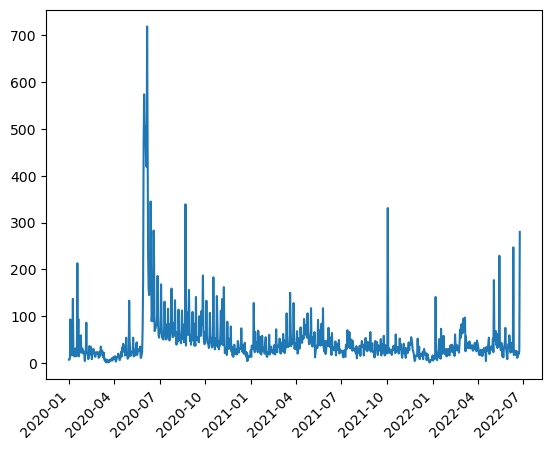

In [29]:
plt.plot(df_dates['event_date_formatted'], df_dates['data_id'])
plt.xticks(rotation=45, ha='right')
plt.show()

### Types of protests over time

In [30]:
df_event_dates =  pd.DataFrame(df.groupby(['event_type', 'sub_event_type', 'event_date_formatted'])['data_id'].count()).reset_index()
df_event_dates

,event_type,sub_event_type,event_date_formatted,data_id
0,Protests,Excessive force against protesters,2020-02-05,1
1,Protests,Excessive force against protesters,2020-05-14,1
2,Protests,Excessive force against protesters,2020-05-29,2
3,Protests,Excessive force against protesters,2020-05-30,4
4,Protests,Excessive force against protesters,2020-05-31,9
...,...,...,...,...
1882,Riots,Violent demonstration,2022-05-09,1
1883,Riots,Violent demonstration,2022-05-11,1
1884,Riots,Violent demonstration,2022-05-13,2
1885,Riots,Violent demonstration,2022-05-17,1


## Event types by year

In [31]:
grp =pd.DataFrame(df.groupby(['year', 'sub_event_type'])['data_id'].count()).reset_index()

In [32]:
grp_pivoted = pd.pivot_table(data=grp, index=['year'], columns=['sub_event_type'], values='data_id')
grp_pivoted = grp_pivoted.reset_index()

[Text(0, 0, '2020'), Text(1, 0, '2021'), Text(2, 0, ' 2022')]

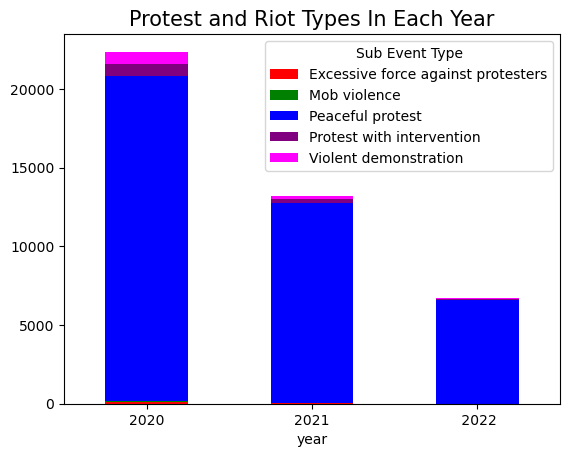

In [33]:
ax = grp_pivoted.plot(x='year',kind='bar',stacked=True, color = ["red", "green", "blue", "purple", "magenta"])
ax.set_title('Protest and Riot Types In Each Year', fontsize=15)
ax.legend(title = 'Sub Event Type')
ax.set_xticklabels(['2020', '2021',' 2022'], rotation=0)


In [34]:
event_types_df = pd.DataFrame(df.groupby(['event_type','event_date_formatted'])['data_id'].count()).reset_index()
event_types_df =  event_types_df.sort_values(by ='event_date_formatted')

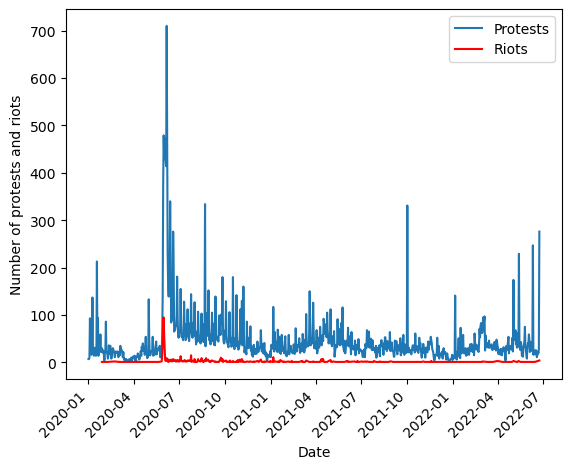

In [35]:
plt.plot(event_types_df.loc[event_types_df['event_type']=='Protests','event_date_formatted'],event_types_df.loc[event_types_df['event_type']=='Protests','data_id'])
plt.plot(event_types_df.loc[event_types_df['event_type']=='Riots','event_date_formatted'],event_types_df.loc[event_types_df['event_type']=='Riots','data_id'], color='red')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Number of protests and riots')
plt.xlabel('Date')
plt.legend(['Protests', 'Riots'])
plt.show()

## What is the distribution of the number of protests by the day of the week?

In [36]:
df_dates.groupby(['weekday'])['data_id'].sum()

KeyError: 'weekday'

#### There are twice as many protests on Saturday on average than any other week.

### What are the most prominent locations of protests?

In [ ]:
df['location'].value_counts()

In [ ]:
df['location'].value_counts().nlargest(20)

### The most prominent locations of protests are cities like New Tork, San Francisco, Philadelphia i.e. cities with large populations primarily on the east and west coast

## Visual location analysis

In [37]:
df_loc = pd.DataFrame(df.groupby(['location', 'country', 'region', 'latitude', 'longitude', 'geo_precision'])['data_id'].count()).reset_index()

In [38]:
df_loc 

,location,country,region,latitude,longitude,geo_precision,data_id
0,4S Ranch,United States,North America,33.0168,-117.1131,1,1
1,Abbeville,United States,North America,29.9747,-92.1343,1,3
2,Aberdeen,United States,North America,33.8251,-88.5437,1,1
3,Aberdeen,United States,North America,35.1313,-79.4306,1,1
4,Aberdeen,United States,North America,39.5096,-76.1641,1,1
...,...,...,...,...,...,...,...
5429,Zanesville,United States,North America,39.9404,-82.0132,1,7
5430,Zephyrhills,United States,North America,28.2393,-82.1764,1,1
5431,Zinc,United States,North America,36.2853,-92.9143,1,1
5432,Zion,United States,North America,42.4461,-87.8329,1,1


### Plot a bubble map showing the concentration of protests

In [39]:
#calculate number of protests by location
df['num_protests_by_location'] = df.groupby(['location', 'latitude', 'longitude', 'sub_event_type'])['data_id'].transform(lambda x: x.count())

In [40]:
fig = px.scatter_geo(df, 
                        lat="latitude", 
                        lon="longitude", 
                     locationmode = 'USA-states',
#                         hover_name="Address", 
#                         hover_data=["Address", "Listed"],
                        #color="Listed",
                        #color_continuous_scale=color_scale,
                        size="num_protests_by_location")
                        #zoom=8, 
#                         height=800,
#                         width=800)
fig.update_layout(title = 'US protests map', title_x=0.5,  geo = dict(
            scope = 'usa'))
#fig.write_image("fig1.jpeg")
#fig.show()

In [41]:
df['region'].unique()

array(['North America'], dtype=object)

### Location of protests colored by sub-event type

In [42]:
fig = px.scatter_geo(df, 
                        lat="latitude", 
                        lon="longitude", 
                     locationmode = 'USA-states',
                        hover_name="location", 
                        hover_data=["location"],
                        color="sub_event_type",
                        #color_discrete_sequence=["red", "green", "blue", "purple", "magenta"],
                        size="num_protests_by_location")
                        #zoom=8, 
#                         height=800,
#                         width=800)
fig.update_layout(title = 'US protests map', title_x=0.5,  geo = dict(
            scope = 'usa'))
pio.write_image(fig, "fig2_high_res.png", scale=6, width=1080, height=1080)
fig.show()

### What are the most commonly appearing actors and associated actors?

In [43]:
df['actor1'].value_counts()

actor1
Protesters (United States)    41166
Rioters (United States)        1072
Protesters (International)        7
Protesters (Ethiopia)             5
Protesters (Turkmenistan)         2
Protesters (Israel)               1
Name: count, dtype: int64

### Most commonly appearing associated actors over time:

In [44]:
df_actors_1 = pd.DataFrame(df.groupby(['event_date_formatted','assoc_actor_1','year'])['data_id'].count()).reset_index()
df_actors_1 

,event_date_formatted,assoc_actor_1,year,data_id
0,2020-01-01,BLM: Black Lives Matter,2020,1
1,2020-01-01,Government of the United States (2017-2021),2020,1
2,2020-01-01,Health Workers (United States),2020,1
3,2020-01-02,Labour Group (United States); Teachers (United...,2020,1
4,2020-01-02,Occupy Movement,2020,1
...,...,...,...,...
16992,2022-06-24,Women (United States); Rise Up 4 Abortion Righ...,2022,1
16993,2022-06-24,Women (United States); Rise Up 4 Abortion Righ...,2022,1
16994,2022-06-24,Women (United States); Rise Up 4 Abortion Righ...,2022,1
16995,2022-06-24,Women (United States); Students (United States),2022,2


In [45]:
df_actors_1 ['assoc_actors_split'] =  df_actors_1 ['assoc_actor_1'].apply(lambda x: x.split('; ') if pd.isna(x) == False else x)

In [46]:
df_actors_1

,event_date_formatted,assoc_actor_1,year,data_id,assoc_actors_split
0,2020-01-01,BLM: Black Lives Matter,2020,1,[BLM: Black Lives Matter]
1,2020-01-01,Government of the United States (2017-2021),2020,1,[Government of the United States (2017-2021)]
2,2020-01-01,Health Workers (United States),2020,1,[Health Workers (United States)]
3,2020-01-02,Labour Group (United States); Teachers (United...,2020,1,"[Labour Group (United States), Teachers (Unite..."
4,2020-01-02,Occupy Movement,2020,1,[Occupy Movement]
...,...,...,...,...,...
16992,2022-06-24,Women (United States); Rise Up 4 Abortion Righ...,2022,1,"[Women (United States), Rise Up 4 Abortion Rig..."
16993,2022-06-24,Women (United States); Rise Up 4 Abortion Righ...,2022,1,"[Women (United States), Rise Up 4 Abortion Rig..."
16994,2022-06-24,Women (United States); Rise Up 4 Abortion Righ...,2022,1,"[Women (United States), Rise Up 4 Abortion Rig..."
16995,2022-06-24,Women (United States); Students (United States),2022,2,"[Women (United States), Students (United States)]"


In [47]:
df_actors_1 = df_actors_1.explode('assoc_actors_split').reset_index()
df_actors_1

,index,event_date_formatted,assoc_actor_1,year,data_id,assoc_actors_split
0,0,2020-01-01,BLM: Black Lives Matter,2020,1,BLM: Black Lives Matter
1,1,2020-01-01,Government of the United States (2017-2021),2020,1,Government of the United States (2017-2021)
2,2,2020-01-01,Health Workers (United States),2020,1,Health Workers (United States)
3,3,2020-01-02,Labour Group (United States); Teachers (United...,2020,1,Labour Group (United States)
4,3,2020-01-02,Labour Group (United States); Teachers (United...,2020,1,Teachers (United States)
...,...,...,...,...,...,...
38724,16996,2022-06-24,Women (United States); Students (United States...,2022,1,Women (United States)
38725,16996,2022-06-24,Women (United States); Students (United States...,2022,1,Students (United States)
38726,16996,2022-06-24,Women (United States); Students (United States...,2022,1,Teachers (United States)
38727,16996,2022-06-24,Women (United States); Students (United States...,2022,1,DSA: Democratic Socialists of America


In [48]:
df_actors_1.groupby('assoc_actors_split')['data_id'].count().nlargest(20)

assoc_actors_split
Students (United States)                                             3276
Labour Group (United States)                                         3061
BLM: Black Lives Matter                                              2857
Women (United States)                                                2126
Government of the United States (2021-)                              1910
African American Group (United States)                               1774
DEM: Democratic Party                                                1700
Teachers (United States)                                             1310
Health Workers (United States)                                        997
LGBT (United States)                                                  792
Latinx Group (United States)                                          775
Christian Group (United States)                                       599
Government of the United States (2017-2021)                           591
GOP: Republican Par

In [49]:
top_10_assoc = list(df_actors_1.groupby('assoc_actors_split')['data_id'].count().nlargest(10).index)

In [50]:
top_10_assoc

['Students (United States)',
 'Labour Group (United States)',
 'BLM: Black Lives Matter',
 'Women (United States)',
 'Government of the United States (2021-)',
 'African American Group (United States)',
 'DEM: Democratic Party',
 'Teachers (United States)',
 'Health Workers (United States)',
 'LGBT (United States)']

### The most commonly occurring associated actors were Students, the Labour Group, Govt of the US, BLM, the Democratic Party, and Women

In [51]:
### plot time trends for top 10 associated actors

In [52]:
df_actors_top_10 = df_actors_1[df_actors_1['assoc_actors_split'].isin(top_10_assoc)]


In [53]:
assoc_actors_df = pd.DataFrame(df_actors_top_10.groupby(['event_date_formatted', 'assoc_actors_split','year' ])['data_id'].count()).reset_index()
assoc_actors_df

,event_date_formatted,assoc_actors_split,year,data_id
0,2020-01-01,BLM: Black Lives Matter,2020,1
1,2020-01-01,Health Workers (United States),2020,1
2,2020-01-02,Labour Group (United States),2020,1
3,2020-01-02,Students (United States),2020,1
4,2020-01-02,Teachers (United States),2020,1
...,...,...,...,...
6162,2022-06-24,LGBT (United States),2022,6
6163,2022-06-24,Labour Group (United States),2022,7
6164,2022-06-24,Students (United States),2022,14
6165,2022-06-24,Teachers (United States),2022,4


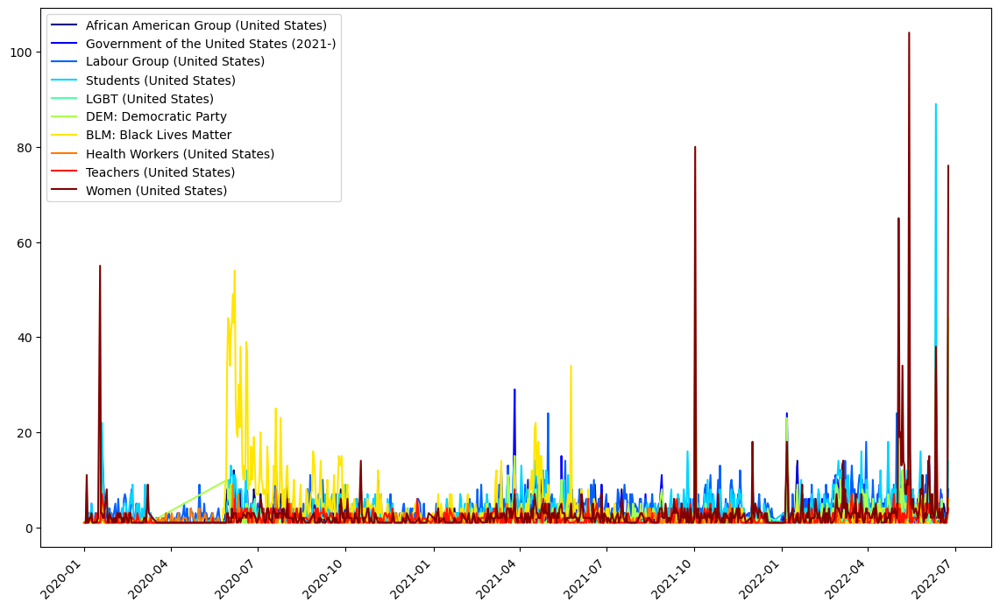

In [54]:
labels = set(assoc_actors_df ['assoc_actors_split'].values)
colors = pl.cm.jet(np.linspace(0,1,len(labels)))
plt.figure(figsize=(14,8))
for key, color in zip(labels, range(len(labels))):
    data_x = assoc_actors_df.loc[assoc_actors_df['assoc_actors_split']==key]['event_date_formatted']
    data_y = assoc_actors_df.loc[assoc_actors_df['assoc_actors_split']==key]['data_id']
    plt.plot(data_x, data_y, color=colors[color], label=key)
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.show()

## Group by year and month

In [55]:
df_actors_1['month'] =df_actors_1['event_date_formatted'].dt.month

In [56]:
df_month = pd.DataFrame(df_actors_1.groupby(['year', 'month','assoc_actors_split'])['data_id'].count()).reset_index()

In [57]:
df_month

,year,month,assoc_actors_split,data_id
0,2020,1,ACLU: American Civil Liberties Union,3
1,2020,1,AFL-CIO: American Federation of Labor and Cong...,3
2,2020,1,"AFSCME: American Federation of State, County a...",3
3,2020,1,ANSWER: Act Now to Stop War and End Racism,12
4,2020,1,Abolish ICE,1
...,...,...,...,...
4413,2022,6,WTP: We the People,1
4414,2022,6,We are CASA,2
4415,2022,6,Westboro Baptist Church,1
4416,2022,6,Women (United States),198


#### 2020

In [58]:
assoc_actors_2020 = assoc_actors_df[assoc_actors_df['year'] == 2020].sort_values(by = 'event_date_formatted')

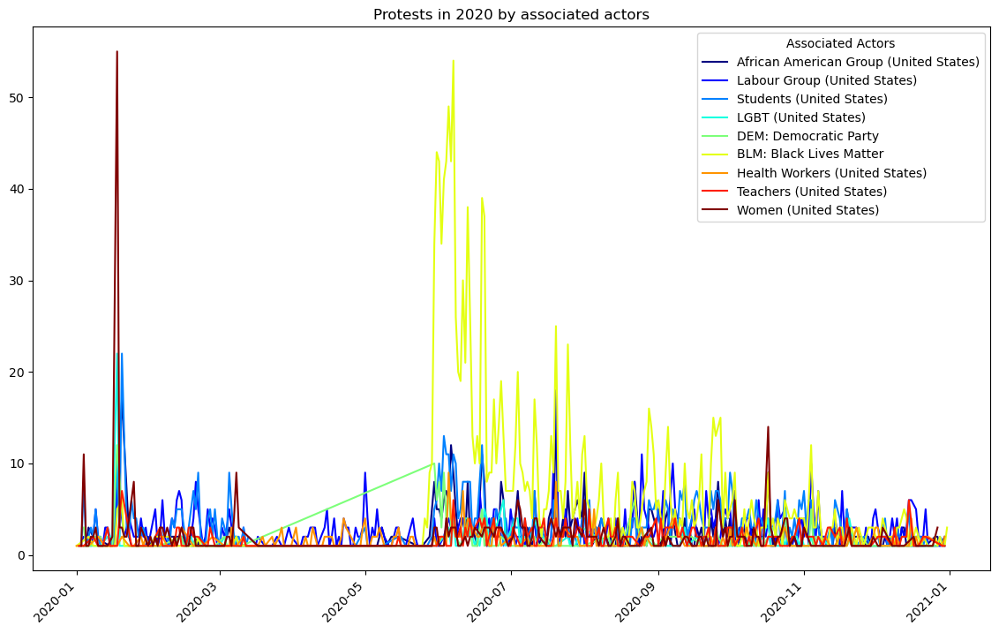

In [59]:
labels = set(assoc_actors_2020 ['assoc_actors_split'].values)
colors = pl.cm.jet(np.linspace(0,1,len(labels)))
plt.figure(figsize=(14,8))
for key, color in zip(labels, range(len(labels))):
    data_x = assoc_actors_2020.loc[assoc_actors_2020['assoc_actors_split']==key]['event_date_formatted']
    data_y = assoc_actors_2020.loc[assoc_actors_2020['assoc_actors_split']==key]['data_id']
    plt.plot(data_x, data_y, color=colors[color], label=key)
plt.legend(title = 'Associated Actors')
plt.title('Protests in 2020 by associated actors')
plt.xticks(rotation=45, ha='right')
plt.show()

In [60]:
df_month = df_month[df_month['year']== 2020]
df_month[df_month['data_id']>50]['assoc_actors_split'].unique()

array(['Government of the United States (2017-2021)',
       'Labour Group (United States)', 'Students (United States)',
       'Women (United States)', 'BLM: Black Lives Matter',
       'African American Group (United States)',
       'Christian Group (United States)', 'DEM: Democratic Party',
       'Health Workers (United States)', 'LGBT (United States)',
       'NAACP: National Association for the Advancement of Colored People',
       'Police Forces of the United States (2017-2021)',
       'Teachers (United States)', 'Pro-Police Group (United States)'],
      dtype=object)

## Plot the most common associated actors on a monthly basis in each year

In [61]:
df_month = pd.DataFrame(df_actors_1.groupby(['year', 'month','assoc_actors_split'])['data_id'].count()).reset_index()
df_month = df_month[df_month['year']== 2020]
df_month = df_month[df_month['data_id']>50]

In [62]:
df_month 

,year,month,assoc_actors_split,data_id
33,2020,1,Government of the United States (2017-2021),55
48,2020,1,Labour Group (United States),65
94,2020,1,Students (United States),100
114,2020,1,Women (United States),109
161,2020,2,Labour Group (United States),85
207,2020,2,Students (United States),92
332,2020,4,Labour Group (United States),59
380,2020,5,BLM: Black Lives Matter,113
416,2020,5,Labour Group (United States),66
461,2020,6,African American Group (United States),128


<Axes: xlabel='month', ylabel='Count'>

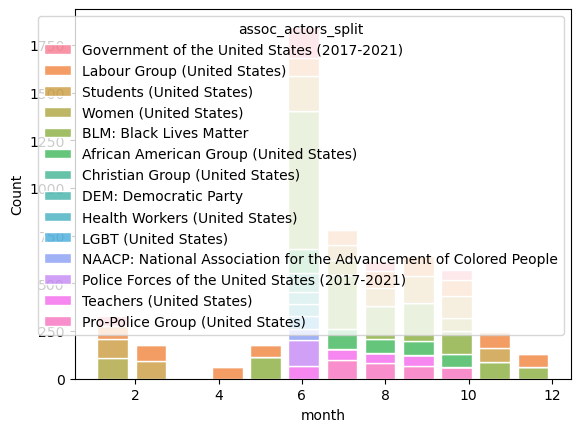

In [63]:
sns.histplot(
    df_month,
    x='month',
    # Use the value variable here to turn histogram counts into weighted
    # values.
    weights='data_id',
    hue='assoc_actors_split',
    multiple='stack',
        bins=12,
    edgecolor='white',
    # Shrink the bars a bit so they don't touch.
    shrink=0.8
    )

In [82]:
#Function to plot the monthly
def plot_monthly_assoc_actors(year, threshold):
    df_month = pd.DataFrame(df_actors_1.groupby(['year', 'month','assoc_actors_split'])['data_id'].count()).reset_index()
    df_month = df_month[df_month['year']== year]
    df_month = df_month[df_month['data_id']>threshold]
    
    ax = sns.histplot(
    df_month,
    x='month',
    # Use the value variable here to turn histogram counts into weighted
    # values.
    weights='data_id',
    hue='assoc_actors_split',
    multiple='stack',
        bins=12,
    edgecolor='white',
    # Shrink the bars a bit so they don't touch.
    shrink=0.8
    )
    sns.set_theme(rc={'figure.figsize':(20,10)})
    sns.move_legend(ax, "upper right")
    #ax.legend(labels = df_month['assoc_actors_split'].unique(), title='Associated actors', fontsize=16)
    plt.title('Associated Actors of Protests in {}'.format(year), size=20)
     # Get the current legend and update the title
    legend = ax.get_legend()
    new_legend_title = 'Associated Actors'
    legend.set_title(new_legend_title, prop={'size': 16})
    plt.setp(ax.get_legend().get_texts(), fontsize='16') # for legend text
    
    plt.xlabel('Month', size=20)
    plt.ylabel('Number of Protests or Riots', size=20)
    plt.savefig('monthly_assoc_actors_{}.png'.format(year))
    plt.show()

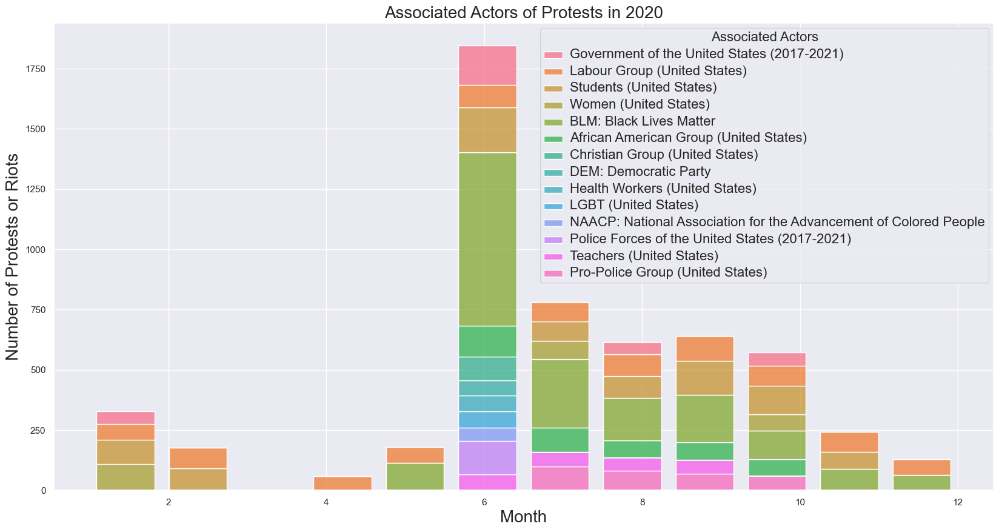

In [83]:
plot_monthly_assoc_actors(2020, 50)

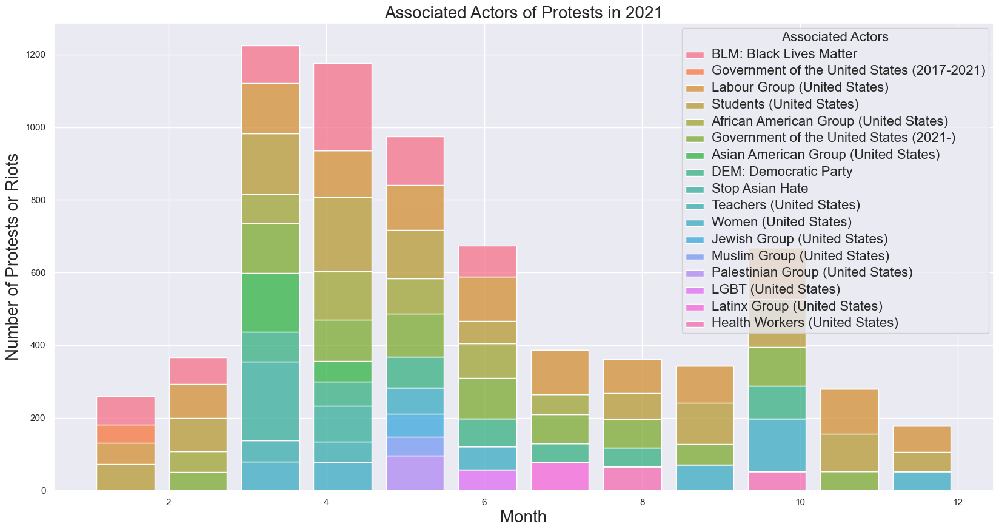

In [84]:
plot_monthly_assoc_actors(2021, 50)

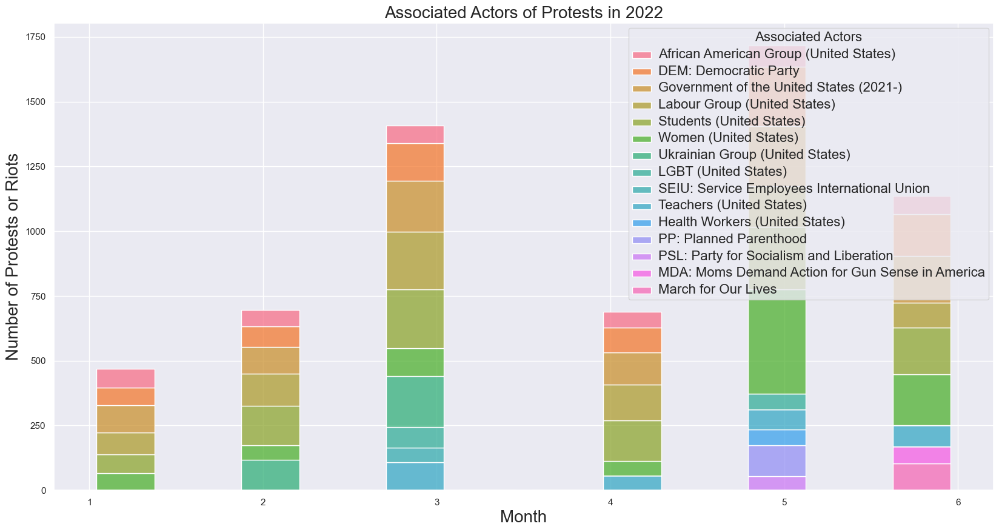

In [85]:
plot_monthly_assoc_actors(2022, 50)

### Caveat: There are more than one associated actors linked with several protest and riots, so the total count of the plots is not reflective of the total count of protests and riots

#### Briefly looking at Actor 2 (the column contains missing data)

In [86]:
df['actor2'].value_counts()

actor2
Protesters (United States)                                                                   1678
Police Forces of the United States (2017-2021)                                               1332
Police Forces of the United States (2021-)                                                    365
Rioters (United States)                                                                       151
Sole Perpetrator (United States)                                                              130
Civilians (United States)                                                                     108
Police Forces of the United States (2017-2021) Prison Guards                                   23
Private Security Forces (United States)                                                        21
Police Forces of the United States (2017-2021) Protecting American Communities Task Force      17
Police Forces of the United States (2021-) Department of Homeland Security                      9
Police Forces

## Are there different sources for different associated actors?
Look at top sources of top 10 associated actors

In [87]:
#sources for BLM and students
df.loc[df['assoc_actor_1']== 'BLM: Black Lives Matter','source'].value_counts()

source
Twitter                                          63
Crowd Counting Consortium; Twitter               45
Liveuamap                                        42
Twitter; Crowd Counting Consortium               32
Count Love                                       30
                                                 ..
News Journal (Wilmington-OH)                      1
Crowd Counting Consortium; San Bernardino Sun     1
KOTV6; Tulsa World                                1
Fox2 (St. Louis); St. Louis American              1
Count Love; Hill                                  1
Name: count, Length: 4411, dtype: int64

In [88]:
df.loc[df['assoc_actor_1']== 'Students (United States)','source'].value_counts()

source
Lantern                                                     10
San Diego Union-Tribune                                      9
Twitter                                                      9
New York Post                                                9
Harvard Crimson                                              8
                                                            ..
Crowd Counting Consortium; Beloit Daily News                 1
Crowd Counting Consortium; WEAU13                            1
NBC 7 San Diego; KPBS                                        1
Long Island Herald Newspapers; Crowd Counting Consortium     1
Monticello Herald Journal                                    1
Name: count, Length: 1211, dtype: int64

In [89]:
df['inter1'].value_counts()

inter1
6    41181
5     1072
Name: count, dtype: int64

In [90]:
df['notes'].value_counts()

notes
Around 23 March 2021 (as reported), hundreds of hotel workers with Unite Here rallied and passed out leaflets on Oahu, Maui, and Kauai islands (Hawaii) calling on visitors to follow coronavirus guidelines. [size=hundreds]                                                                                                                                                                                                                                                                                                                                                                                                                              3
On 14 August 2020, an unreported number of people staged 'Roundabout Rallies' in Kings Beach, Meyers, Tahoe City, and Truckee (California) and in Incline Village (Nevada) in support of Lake Tahoe visitors cleaning up after themselves and against littering. Demonstrations occurred at five major entries to the Tahoe Basin. [size=no report]                  

# Next Steps
* Analyze 'notes' column and use natural language processing to learn more about the nature of protests and riots
* Look for sources of bias in the data by more closely analyzing sources and precision columns for actors and associated actors
* Analyze combinations of actor1 and actor2 and respective associated actors to learn which actors tend to be involved in the same riots; The same can be done using associated actors.